# Analysing gradient receptive fields of neurons in V4 monkeys

This notebook is about analysing what most strongly activates neurons in V4 and what pixels in an image have to change in order to stimulate the neuron. The gradient RF are calculated for individual images and individual neurons.   

In [1]:
%load_ext autoreload
%autoreload 

import numpy as np
from numpy.linalg import eig
from numpy.linalg import solve
import matplotlib.pyplot as plt
import matplotlib.colors as mat_col
import torch

import nnfabrik
from nnfabrik import builder


import numpy as np
import pickle
import os

from os import listdir
from os.path import isfile, join

import matplotlib.pyplot as plt

import nnvision

import datajoint as dj
dj.config['enable_python_native_blobs'] = True


dj.config['database.user']= 'kanderer'
dj.config['database.password']= 'enamel-vendetta-deodorant'


schema_name = 'nnfabrik_monkey_saliency'

schema = dj.schema(schema_name, locals())
dj.config['nnfabrik.schema_name'] = schema_name

from nnfabrik.main import *

Connecting kanderer@134.2.168.16:3306


In [2]:
import datajoint as dj

dj.config['enable_python_native_blobs'] = True

from nnfabrik.templates.trained_model import TrainedModelBase
from nnfabrik.main import *
import os

if not 'stores' in dj.config:
    dj.config['stores'] = {}
    
dj.config['stores']['minio'] = {  # store in s3
    'protocol': 's3',
    'endpoint': os.environ.get('MINIO_ENDPOINT', 'DUMMY_ENDPOINT'),
    'bucket': 'nnfabrik',
    'location': 'dj-store',
    'access_key': os.environ.get('MINIO_ACCESS_KEY', 'FAKEKEY'),
    'secret_key': os.environ.get('MINIO_SECRET_KEY', 'FAKEKEY')
}

In [3]:
basepath = '/data/monkey/toliaslab/CSRF19_V4'
neuronal_data_path = os.path.join(basepath, 'neuronal_data/')
neuronal_data_files = [neuronal_data_path + f for f in listdir(neuronal_data_path) if isfile(join(neuronal_data_path, f))]
image_cache_path = os.path.join(basepath, 'images')

saliency_cache_path = os.path.join(basepath, 'images_saliency')
print(saliency_cache_path)

/data/monkey/toliaslab/CSRF19_V4/images_saliency


In [4]:
@schema
class TrainedModel(TrainedModelBase):
    table_comment = "Trained models"
    storage = "minio"
    model_table = Model
    dataset_table = Dataset
    trainer_table = Trainer
    seed_table = Seed
    user_table = Fabrikant

### Loading a already trained CNN model with a Gaussian readout

In [5]:
key = dict(model_hash='cec63aa4435b2a205ec02eafc0a745ee', dataset_hash='ce98e82c2543a503de7611648340380e', trainer_hash = 'f03a6527ab0422767da50e67e2d543ef')

dataloader, model = (TrainedModel & key).load_model()

In [6]:
model

Encoder(
  (core): SE2dCore(
    (_input_weights_regularizer): LaplaceL2norm(
      (laplace): Laplace()
    )
    (features): Sequential(
      (layer0): Sequential(
        (conv): Conv2d(1, 32, kernel_size=(15, 15), stride=(1, 1), bias=False)
        (norm): BatchNorm2d(32, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
        (nonlin): ELU(alpha=1.0, inplace=True)
      )
      (layer1): Sequential(
        (ds_conv): DepthSeparableConv2d(
          (in_depth_conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (spatial_conv): Conv2d(32, 32, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4), groups=32, bias=False)
          (out_depth_conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
        )
        (norm): BatchNorm2d(32, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
        (nonlin): ELU(alpha=1.0, inplace=True)
      )
      (layer2): Sequential(
        (ds_conv): DepthSeparableConv2d(
          

### Get the best neurons based on test correlation scores

In [7]:
from nnvision.tables.scores import TestCorrelationScore
from nnvision.tables.main import Recording
from nnvision.tables.scores import TestCorrelationScoreEnsemble

In [8]:
Recording.Units.fetch()

#Recording.populate()

array([('nnsaliency.datasets.monkey_loaders.monkey_static_loader', '027480e2e61c8e46a9b86c67023232cc', '3645713184967',  1, 1,  0,  3, 1470.),
       ('nnsaliency.datasets.monkey_loaders.monkey_static_loader', '027480e2e61c8e46a9b86c67023232cc', '3645713184967',  2, 1,  1,  3, 1470.),
       ('nnsaliency.datasets.monkey_loaders.monkey_static_loader', '027480e2e61c8e46a9b86c67023232cc', '3645713184967',  5, 1,  2,  4, 1350.),
       ...,
       ('nnvision.datasets.monkey_loaders.monkey_static_loader', 'ce98e82c2543a503de7611648340380e', '3654087847388', 16, 1,  8, 12,  390.),
       ('nnvision.datasets.monkey_loaders.monkey_static_loader', 'ce98e82c2543a503de7611648340380e', '3654087847388', 17, 1,  9, 13,  270.),
       ('nnvision.datasets.monkey_loaders.monkey_static_loader', 'ce98e82c2543a503de7611648340380e', '3654087847388', 18, 1, 10, 13,  270.)],
      dtype=[('dataset_fn', 'O'), ('dataset_hash', 'O'), ('data_key', 'O'), ('unit_id', '<i8'), ('unit_type', '<i8'), ('unit_index', '<

In [9]:
best_five = (Recording.Units*TestCorrelationScore.Units & key).fetch("data_key", "unit_id","unit_index", "unit_test_correlation",limit=5, order_by="unit_test_correlation DESC", as_dict=True)

In [10]:
best_100 = (Recording.Units*TestCorrelationScore.Units & key).fetch("data_key", "unit_id","unit_index", "unit_test_correlation",limit=100, order_by="unit_test_correlation DESC", as_dict=True)#best_5 = (TestCorrelationScore.Units & key).fetch("KEY", "unit_test_correlation", limit=5, order_by="unit_test_correlation DESC")

In [11]:
best_five

[{'data_key': '3649689088057',
  'unit_id': 7,
  'unit_index': 5,
  'unit_test_correlation': 0.78306},
 {'data_key': '3649689088057',
  'unit_id': 3,
  'unit_index': 2,
  'unit_test_correlation': 0.679932},
 {'data_key': '3648644839726',
  'unit_id': 8,
  'unit_index': 5,
  'unit_test_correlation': 0.634252},
 {'data_key': '3648051669051',
  'unit_id': 4,
  'unit_index': 2,
  'unit_test_correlation': 0.62688},
 {'data_key': '3653061170515',
  'unit_id': 9,
  'unit_index': 6,
  'unit_test_correlation': 0.610875}]

### Extracting a list of images and the neuron responses:

In [12]:
#extracts the images were the 5 neurons with best test correlation were trained on:

train_images1 = []
targets_list1 = []
for batch in dataloader["train"]['3649689088057']:
    images = batch.inputs
    responses = batch.targets

    for i in range(0, images.shape[0]):
        train_images1.append(images[i])
        targets_list1.append(responses[i])
    
train_images3 = []
targets_list3 = []
for batch in dataloader["train"]['3648644839726']:
    images = batch.inputs
    responses = batch.targets

    for i in range(0, images.shape[0]):
        train_images3.append(images[i])
        
        targets_list3.append(responses[i])

train_images4 = []
targets_list4 = []
for batch in dataloader["train"]['3648051669051']:
    images = batch.inputs
    responses = batch.targets

    for i in range(0, images.shape[0]):
        train_images4.append(images[i])
        
        targets_list4.append(responses[i])
    
    
train_images5 = []
targets_list5 = []
for batch in dataloader["train"]['3653061170515']:
    images = batch.inputs
    responses = batch.targets

    for i in range(0, images.shape[0]):
        train_images5.append(images[i])
        
        targets_list5.append(responses[i])
    


train_images6 = []
targets_list6 = []
for batch in dataloader["train"]['3653061170515']:
    images = batch.inputs
    responses = batch.targets

    for i in range(0, images.shape[0]):
        train_images6.append(images[i])
        
        targets_list6.append(responses[i])
    
print(len(targets_list6))



9789


### Example based visualizeation approach:

What were the images that activated the neurons most? Can we maybe see a pattern from there?

tensor(27.)
tensor(25.)
tensor(24.)
tensor(23.)
tensor(22.)
tensor(21.)
tensor(20.)
tensor(19.)
tensor(18.)
tensor(17.)
tensor(16.)
tensor(15.)


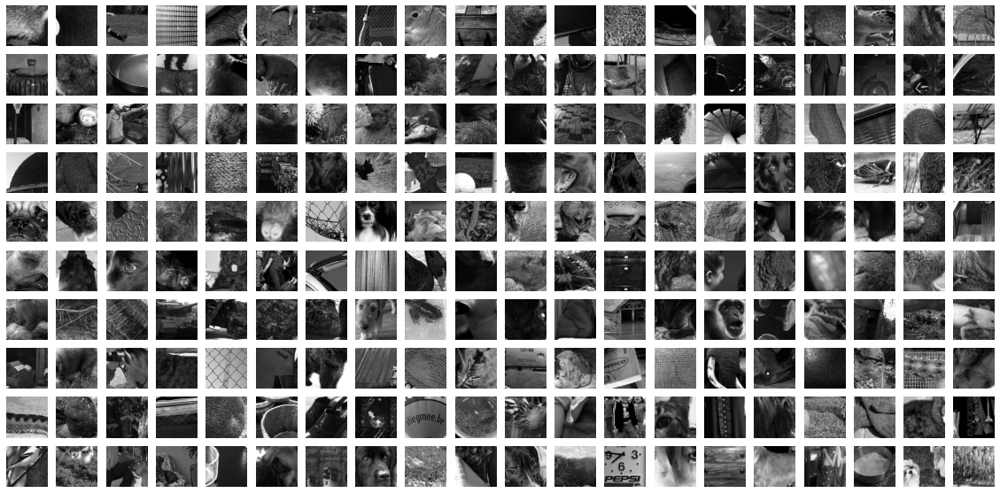

In [13]:
## plot the 200 images that excited neuron 1 (neuron with best test correlation best strongly)

best_images_neuron1 = []
target_neuron_1 = []

activations = []
for index in range(0, len(train_images1)):
    activations.append(targets_list1[index][5])
    
sorted_act = sorted(activations)   

max_values = []
for i in range (1, 201):
    max_value = sorted_act[-i]
    if max_value not in max_values:
        max_values.append(max_value)
        print(max_value)

        indices = [i for i, x in enumerate(np.vstack(targets_list1)[:,5]) if x == max_value]

        for index in indices:
            best_images_neuron1.append(train_images1[index])
            target_neuron_1.append(targets_list1[index][5])
            
fig, axs = plt.subplots(10, 20, figsize=(20,10))

i = 0
for k in range(0, 10):
    for p in range(0, 20):
        axs[k][p].imshow(best_images_neuron1[i].squeeze(0), cmap='gray')
        axs[k][p].axis('off')
        i+=1
        
plt.savefig('200_most_activated_img_for_neuron_best_testcorr.png')

tensor(18.)
tensor(17.)
tensor(16.)
tensor(15.)
tensor(14.)
tensor(13.)


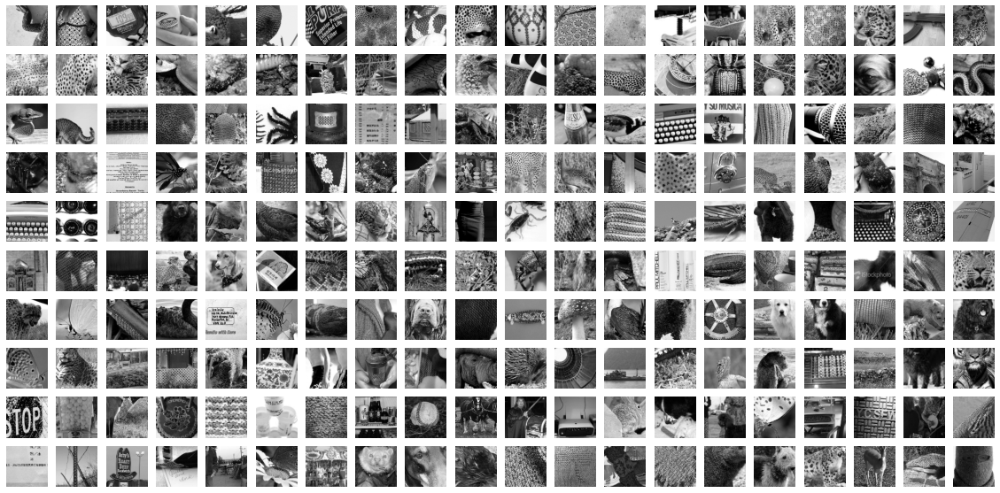

In [14]:
best_images_neuron2 = []
target_neuron_2 = []

activations = []
for index in range(0, len(train_images1)):
    activations.append(targets_list1[index][2])
    
sorted_act = sorted(activations)   

max_values = []
for i in range (1, 201):
    max_value = sorted_act[-i]
    if max_value not in max_values:
        max_values.append(max_value)
        print(max_value)
        indices = [i for i, x in enumerate(np.vstack(targets_list1)[:,2]) if x == max_value]

        for index in indices:
            best_images_neuron2.append(train_images1[index])
            target_neuron_2.append(targets_list1[index][2])
     
            
    
fig, axs = plt.subplots(10, 20, figsize=(20,10))

i = 0
for k in range(0, 10):
    for p in range(0, 20):
        axs[k][p].imshow(best_images_neuron2[i].squeeze(0), cmap='gray')
        i+=1
        axs[k][p].axis('off')
        
plt.savefig('200_best_img_third_best_neuron.png')

tensor(13.)
tensor(12.)
tensor(11.)
tensor(10.)
tensor(9.)
tensor(8.)
tensor(7.)
tensor(6.)
tensor(5.)


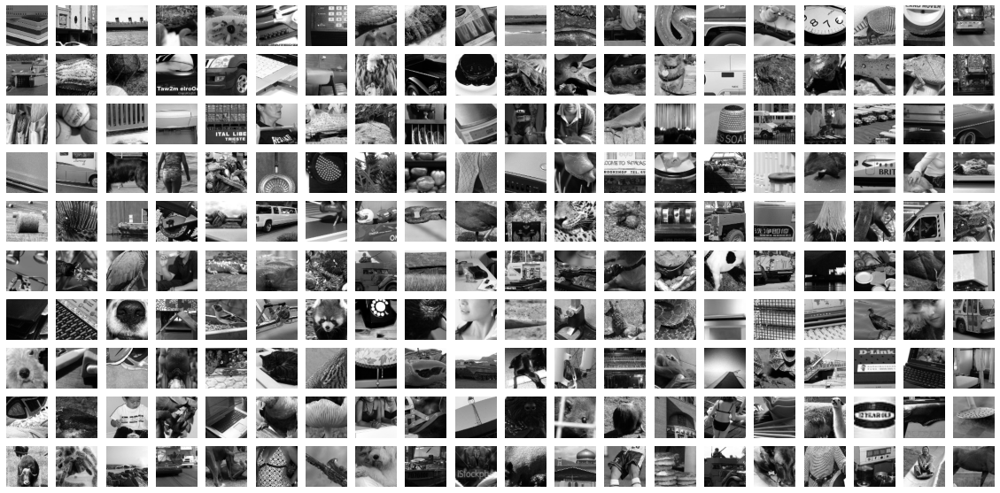

In [15]:
best_images_neuron3 = []
target_neuron_3 = []



activations = []
for index in range(0, len(train_images3)):
    activations.append(targets_list3[index][5])
    
sorted_act = sorted(activations)   

max_values = []
for i in range (1, 201):
    max_value = sorted_act[-i]
    if max_value not in max_values:
        max_values.append(max_value)
        print(max_value)
        indices = [i for i, x in enumerate(np.vstack(targets_list3)[:,5]) if x == max_value]

        for index in indices:
            best_images_neuron3.append(train_images3[index])
            target_neuron_3.append(targets_list3[index][5])
     
            
    
fig, axs = plt.subplots(10, 20, figsize=(20,10))

i = 0
for k in range(0, 10):
    for p in range(0, 20):
        axs[k][p].imshow(best_images_neuron3[i].squeeze(0), cmap='gray')
        i+=1
        axs[k][p].axis('off')
        
plt.savefig('200_best_img_third_best_neuron.png')

tensor(12.)
tensor(10.)
tensor(9.)
tensor(8.)
tensor(7.)
tensor(6.)
tensor(5.)


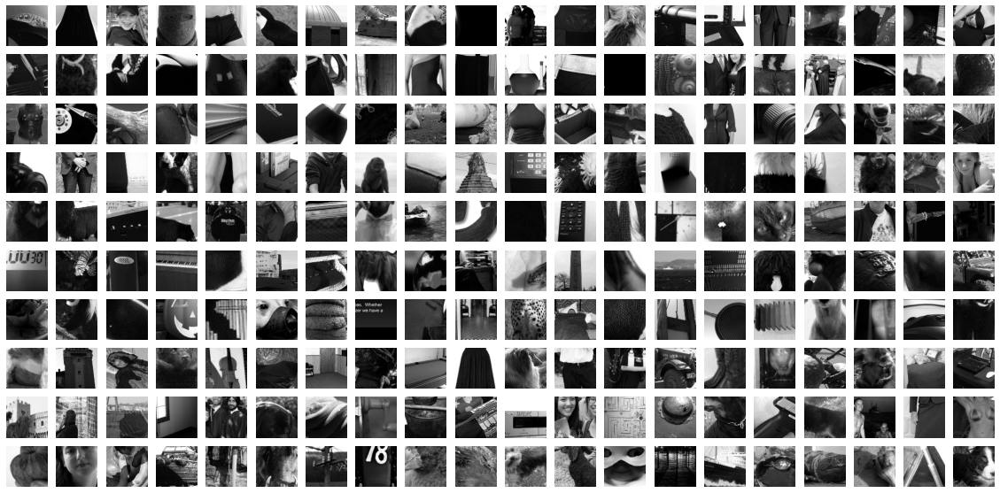

In [16]:
best_images_neuron4 = []
target_neuron_4 = []



activations = []
for index in range(0, len(train_images4)):
    activations.append(targets_list4[index][2])
    
sorted_act = sorted(activations)   

max_values = []
for i in range (1, 201):
    max_value = sorted_act[-i]
    if max_value not in max_values:
        max_values.append(max_value)
        print(max_value)
        indices = [i for i, x in enumerate(np.vstack(targets_list4)[:,2]) if x == max_value]

        for index in indices:
            best_images_neuron4.append(train_images4[index])
            target_neuron_4.append(targets_list4[index][2])
     
            
    
fig, axs = plt.subplots(10, 20, figsize=(20,10))

i = 0
for k in range(0, 10):
    for p in range(0, 20):
        axs[k][p].imshow(best_images_neuron4[i].squeeze(0), cmap='gray')
        i+=1
        axs[k][p].axis('off')
        
plt.savefig('200_best_img_fourth_best_neuron.png')

tensor(11.)
tensor(9.)
tensor(8.)
tensor(7.)
tensor(6.)
tensor(5.)
tensor(4.)
tensor(3.)


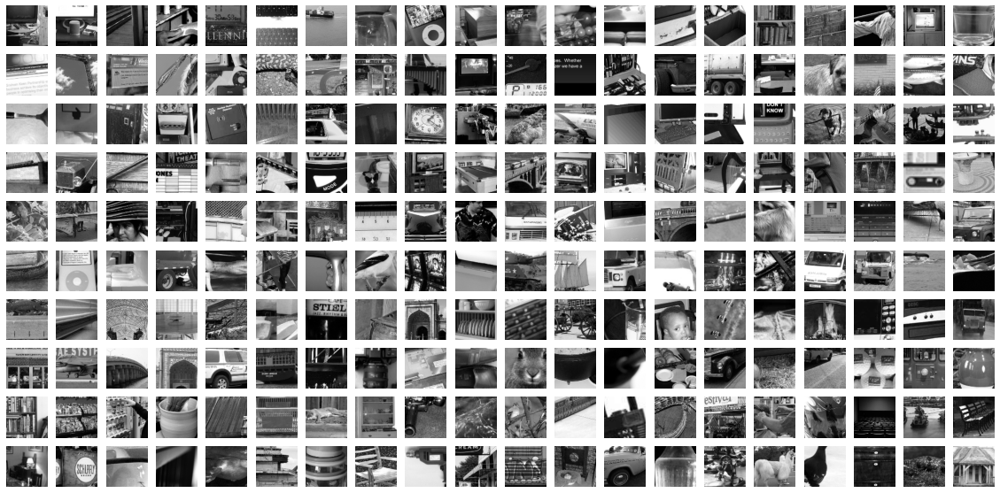

In [17]:
best_images_neuron5 = []
target_neuron_5 = []



activations = []
for index in range(0, len(train_images5)):
    activations.append(targets_list5[index][6])
    
sorted_act = sorted(activations)   

max_values = []
for i in range (1, 201):
    max_value = sorted_act[-i]
    if max_value not in max_values:
        max_values.append(max_value)
        print(max_value)
        indices = [i for i, x in enumerate(np.vstack(targets_list5)[:,6]) if x == max_value]

        for index in indices:
            best_images_neuron5.append(train_images5[index])
            target_neuron_5.append(targets_list5[index][6])
     
            
    
fig, axs = plt.subplots(10, 20, figsize=(20,10))

i = 0
for k in range(0, 10):
    for p in range(0, 20):
        axs[k][p].imshow(best_images_neuron5[i].squeeze(0), cmap='gray')
        i+=1
        axs[k][p].axis('off')
        
plt.savefig('200_best_img_fifth_best_neuron.png')

### One problem: Neurons often didn't 'LOOK' at the same images or didn't respond to the images strongly.

The following is an approach to extract the images of the 7 neurons of session: 3646222772876 with the best test correlation. I will calculate the gradient receptive fields for 500 of them - taking into account a PCA that takes all the images that were in the session as input

In [91]:
train_images_session = []
targets_list_session = []


for batch in dataloader["train"]['3646222772876']:
    images = batch.inputs
    responses = batch.targets

    for i in range(0, images.shape[0]):
        train_images_session.append(images[i])
        
        targets_list_session.append(responses[i])
        
print(len(train_images_session))

train_images = train_images_session[:500]
target_list = targets_list_session[:500]

12345


In [56]:
#unit indices for the 7 neurons with best test corr

key_list = [{'data_key': '3646222772876', 'unit_index': 3},{'data_key': '3646222772876', 'unit_index': 6},{'data_key': '3646222772876', 'unit_index': 4},{'data_key': '3646222772876', 'unit_index': 0},
            {'data_key': '3646222772876', 'unit_index': 7},{'data_key': '3646222772876', 'unit_index': 1},{'data_key': '3646222772876', 'unit_index': 2}]

len(key_list)

keys = [3,6,4,0,7,1,2]

### Get Gradient receptive fields of the 7 neurons within the same session:

In [92]:

n_images = len(train_images) # 100 images would also be fine

n_neurons = 7

RFs = torch.zeros(n_neurons, n_images,*train_images[0].shape[1:]) # preallocating RFs

img_x, img_y = train_images[0].shape[1:] # x and y dim on the image

    
#iterates through the 7 neurons with the best test correlation, selects the right session with ['data_key']
j = 0
for best in key_list:
    images = train_images     #taking same images for every neuron 
    #images = dataloader["train"][best['data_key']].dataset[:].inputs
    for i in range(0, n_images):
        x = images[i].reshape((1,1,images[i].shape[1], images[i].shape[2]))
       
        x = x.clone().detach().requires_grad_(True).to('cpu')
        optimizer = torch.optim.Adam([x], lr = 1.0)
        optimizer.zero_grad()
        
        r = model(x, data_key=best['data_key'], pretrained=True)


        r[0, best['unit_index']].backward(retain_graph=True)
        RFs[j, i] = x.grad.data
    
        x.grad.data.zero_()
    j += 1

(-0.5, 82.5, 82.5, -0.5)

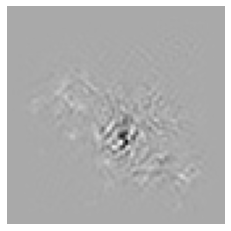

In [21]:
plt.imshow(RFs[0,6], cmap='gray')
plt.axis('off')

### Compute the per Neuron Eigenvalues of the img_x * img_y * n_rfs Matrix with kPCA

In [22]:
rfs_neuron_0 = RFs[0].cpu().detach().numpy().squeeze()


rfs_flattened = np.reshape(rfs_neuron_0,[n_images,-1])
rfs_flattened -= rfs_flattened.mean(axis=1, keepdims=True)

#Kernel matrix 
K = rfs_flattened @ rfs_flattened.T / rfs_flattened.shape[0]
uk, a = eig(K)
uc, a = map(np.real, (uk, a))

#Covariance
#C =  rfs_flattened.T @ rfs_flattened / rfs_flattened.shape[0]
#uc, v = eig(C)
#uk, v = map(np.real, (uc, v))

v2 = rfs_flattened.T @ a
v2 /= np.sqrt( (v2**2).sum(axis=0, keepdims=True)) # normalize each column to length 1 v/||v||_2
v3 = np.reshape(v2,(img_x, img_y, n_images)) # this will be the all eigenvalue RFs. v3[:,:,0] will be the one with the largest component

### 4. Compute Ratio of First and Second Component
for simple cells, we expect that the first PC will be much larger than the second PC (because of phase invariance).
This won't be quite as relevant for mouse data, but why not.

In [23]:
eig_ratio = []
uks = []
RFs_np = RFs.cpu().detach().numpy()

for i in range(0, 7):

    rfs_flattened = RFs_np[i,::].squeeze()

    rfs_flattened = np.reshape(rfs_flattened,[n_images,-1])
    rfs_flattened -= rfs_flattened.mean(axis=1, keepdims=True)
    K = rfs_flattened @ rfs_flattened.T / rfs_flattened.shape[0]
    uk, a = eig(K)
    
    uk, a = map(np.real, (uk, a))
    
    uks.append(uk)
    #C = rfs_flattened.T @ rfs_flattened / rfs_flattened.shape[0]
    #uc, v = eig(C)
    #uc, v = map(np.real, (uc, v))

    eig_ratio.append(uk[1]/uk[0])


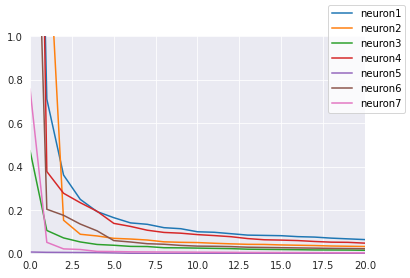

In [24]:
import seaborn as sns

with sns.axes_style('darkgrid'):
    fig, axs = plt.subplots()


axs.plot(uks[0], label = "neuron1")
axs.plot(uks[1], label = "neuron2")
axs.plot(uks[2], label = "neuron3")
axs.plot(uks[3], label = "neuron4")
axs.plot(uks[4], label = "neuron5")
axs.plot(uks[5], label = "neuron6")
axs.plot(uks[6], label = "neuron7")



axs.set_xlim(0, 20)
axs.set_ylim(0,1)
sns.despine(trim=True)
fig.legend()

plt.savefig('eigenvalues_per_neuron.png')

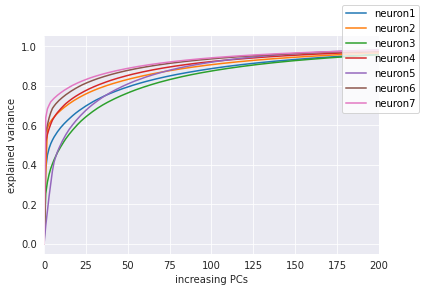

In [25]:
values = {}
num_neurons = 7

for j in range(0, num_neurons):
    value_list = []
    for i in range(0, n_images):
        
        value = np.sum(uks[j][:i])/np.sum(uks[j][:])   
        value_list.append(value)
  
    values[j] = value_list
 


with sns.axes_style('darkgrid'):
    fig, axs = plt.subplots()
axs.plot(values[0], label = "neuron1")
axs.plot(values[1], label = "neuron2")
axs.plot(values[2], label = "neuron3")
axs.plot(values[3], label = "neuron4")
axs.plot(values[4], label = "neuron5")
axs.plot(values[5], label = "neuron6")
axs.plot(values[6], label = "neuron7")


axs.set_xlim(0, 200)
axs.set_ylabel('explained variance')
axs.set_xlabel('increasing PCs')
sns.despine(trim=True)
fig.legend()

plt.savefig('explained_variance_same_images')

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


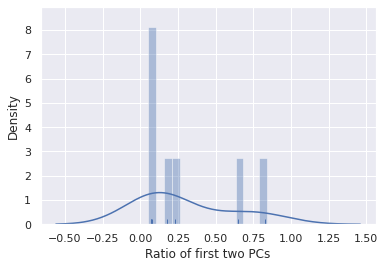

In [26]:
import seaborn as sns
import pandas as pd
sns.set()
x = pd.Series(eig_ratio, name="Ratio of first two PCs")
sns.distplot(x, np.linspace(0,1,20), rug=True)

plt.savefig("density_plot_without_repeats.png")

### Here the reconstructing part is coming

In [27]:

RFs_new = RFs.cpu().detach().numpy()

n_images = len(train_images)

Xpca_list = []
components_included = []
n_components = 150

for i in range(0, 7):

    n_comp = 0
    for value in values[i]:
        if value > 0.95:
            n_components = n_comp
            break
        n_comp += 1
        
        
    components_included.append(n_components)
    rfs_flattened = RFs_new[i,::].squeeze()

    rfs_flattened = np.reshape(rfs_flattened,[n_images,-1])
    

    rfs_mean = rfs_flattened.mean(axis=1, keepdims=True)
    rfs_flattened = rfs_flattened - rfs_mean
    
    K = rfs_flattened @ rfs_flattened.T / rfs_flattened.shape[0]
    uk, eig_vecs = eig(K)

    uk, eig_vecs = map(np.real, (uk, eig_vecs))
    
    ### ordering the eigenvalues and eigenvectors accendingly
    uk, eigvecs = uk[::-1], eig_vecs[:, ::-1]
    

    # get the n-most important eigenvectors:
    matrix_v = eig_vecs[:,0:n_components]

    
    ## P = V ` V ` t
    I = matrix_v.T @ matrix_v
    
    I2 = np.eye(I.shape[0])
    
    np.testing.assert_almost_equal(I, I2, decimal=6)
    
    P = matrix_v @ matrix_v.T 
    
    ## reconstructed x = P * x
    Xpca = P @ rfs_flattened 
    
    
    #normalize the images again:
    Xpca += rfs_mean
    
    
    #bringing images back in shape
    Xpca = np.reshape(Xpca,(n_images,img_x, img_y)) # this will be the all eigenvalue RFs. v3[:,:,0] will be the one with the largest component
    
    Xpca_list.append(Xpca)


    #decode_matrices.append(v3.copy())

In [28]:
np_train_images =np.concatenate(train_images, axis=0 )

print(np_train_images.shape)

(500, 83, 83)


In [29]:
### Now computing reconstruction of images, not gradient receptive fileds:


Imgpca_list = []
components_included = []
n_components = 200


img_flattened = np_train_images.squeeze()

img_flattened = np.reshape(img_flattened,[n_images,-1])

print(img_flattened.shape)
img_mean = img_flattened.mean(axis=1, keepdims=True)
img_flattened = img_flattened - img_mean

K = img_flattened @ img_flattened.T 
uk, eig_vecs = eig(K)

uk, eig_vecs = map(np.real, (uk, eig_vecs))

### ordering the eigenvalues and eigenvectors accendingly
uk, eigvecs = uk[::-1], eig_vecs[:, ::-1]


# get the n-most important eigenvectors:
matrix_v = eig_vecs[:,0:n_components]


## P = V ` V ` t
I = matrix_v.T @ matrix_v

I2 = np.eye(I.shape[0])

np.testing.assert_almost_equal(I, I2, decimal=6)

P = matrix_v @ matrix_v.T 

## reconstructed x = P * x
Imgpca = torch.from_numpy(P) @ img_flattened 


#normalize the images again:
Imgpca += img_mean


#print(Imgpca.shape)
#bringing images back in shape
Imgpca = np.reshape(Imgpca,(n_images,img_x, img_y)) # this will be the all eigenvalue RFs. v3[:,:,0] will be the one with the largest component





(500, 6889)


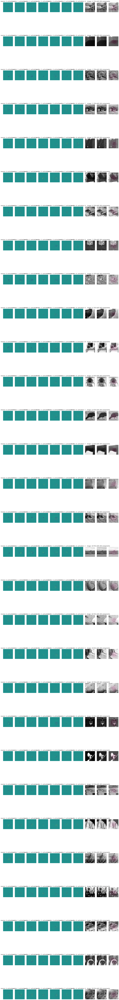

In [53]:
fig, axs = plt.subplots(30, 10, figsize=(20,180))
j = 0 #neuron
i = 0
max_transparency = 0.65

threshold_value = 1e-4 # only values above that will be shown. I guess it's the best to the the np.abs(gradRF) when setting the alphas to zero

i = 0
for k in range(0, 30):
   
    for p in range(0, 7):
    
        max_intensity=np.max(np.abs(Xpca_list[p][i,:,:]))
        min_intensity=np.min(np.abs(Xpca_list[p][i,:,:]))
      

        axs[k][p].title.set_text('neuron: ' + str(p) + ', activation: '+ str(int(targets_list_session[k][p])))

        axs[k][p].imshow(Xpca_list[p][i,:,:] ,cmap=  'viridis', vmin=-max_intensity, vmax = max_intensity)
        axs[k][p].axis('off')
        
        alpha_values = np.ones_like(Xpca_list[p][i,:,:]) * max_transparency
        
        threshold_value = max_intensity - (max_intensity + min_intensity)*0.95
        alpha_values[Xpca_list[p][i,:,:]<threshold_value] = 0
        
        axs[k][9].imshow(Xpca_list[j][i,:,:] , alpha=alpha_values, cmap="PuRd", vmin=-max_intensity, vmax = max_intensity)


    axs[k][7].title.set_text('image: '+ str(i))
    axs[k][7].imshow(train_images[i].squeeze(0) ,cmap=  'gray')
    axs[k][7].axis('off')
    
    axs[k][8].title.set_text('PCA with 200 components')
    axs[k][8].imshow(Imgpca[i,:,:].squeeze(0) ,cmap=  'gray')
    axs[k][8].axis('off')
    

    axs[k][9].imshow(train_images[i].squeeze(0) ,cmap=  'gray', alpha = 0.7)
    axs[k][9].axis('off')
    
    i+=1

        
plt.savefig('comparision_of_4_neurons')

In [31]:
### Now computing reconstruction of images, not gradient receptive fileds:


Imgpca_list = []
components_included = []
n_components = 100

comp_list = [1,2, 5, 20, 50, 100, 200, 300]

for i in comp_list:
    n_components = i
    img_flattened = np_train_images.squeeze()

    img_flattened = np.reshape(img_flattened,[n_images,-1])

    img_mean = img_flattened.mean(axis=1, keepdims=True)
    img_flattened = img_flattened - img_mean

    K = img_flattened @ img_flattened.T 
    uk, eig_vecs = eig(K)

    uk, eig_vecs = map(np.real, (uk, eig_vecs))

    ### ordering the eigenvalues and eigenvectors accendingly
    #uk, eigvecs = uk[::-1], eig_vecs[:, ::-1]


    # get the n-most important eigenvectors:
    matrix_v = eig_vecs[:,0:n_components]
    
    uk = uk[0:n_components]

    ## P = V ` V ` t
    I = matrix_v.T @ matrix_v

    I2 = np.eye(I.shape[0])

    np.testing.assert_almost_equal(I, I2, decimal=6)

    P =   matrix_v  @ matrix_v.T 

    ## reconstructed x = P * x
    Imgpca = torch.from_numpy(P) @ img_flattened 


    #normalize the images again:
    Imgpca += img_mean


    #print(Imgpca.shape)
    #bringing images back in shape
    Imgpca = np.reshape(Imgpca,(n_images,img_x, img_y)) # this will be the all eigenvalue RFs. v3[:,:,0] will be the one with the largest component
    Imgpca_list.append(Imgpca)

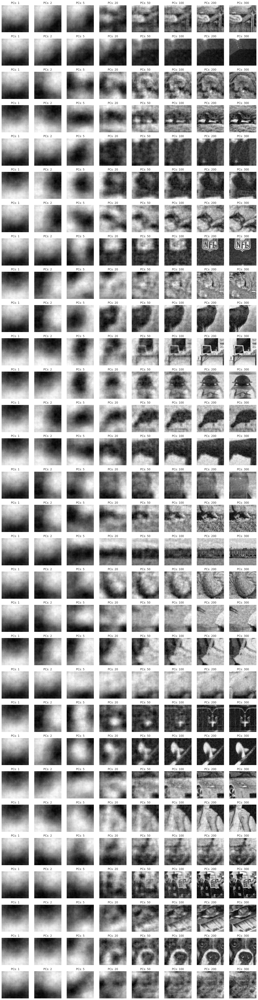

In [32]:

fig, axs = plt.subplots(30, 8, figsize=(20,80))
j = 0 #neuron
i = 0



for k in range(0, 30):
   
    for p in range(0, 8):
        
        axs[k][p].title.set_text('PCs: '+ str(comp_list[p]))

        axs[k][p].imshow(Imgpca_list[p][k,:,:].squeeze(0) ,cmap=  'gray')
        axs[k][p].axis('off')
    
plt.savefig('PCA_for_images')

### PCA idea

In [112]:
RFs_new = RFs.cpu().detach().numpy()

np_train_images =np.concatenate(train_images, axis=0 )

n_images = len(train_images)

Xpca_list2 = []
components_included = []
n_components = 1

for i in range(0, 7):
        
    #components_included.append(n_components)
    img_flattened = np_train_images.squeeze()

    img_flattened = np.reshape(img_flattened,[n_images,-1])
    print(img_flattened.shape)
    img_mean = img_flattened.mean(axis=1, keepdims=True)
    img_flattened = img_flattened - img_mean
    
    rfs_flattened = RFs_new[i,::].squeeze()

    rfs_flattened = np.reshape(rfs_flattened,[n_images,-1])

    rfs_mean = rfs_flattened.mean(axis=1, keepdims=True)
    rfs_flattened = rfs_flattened - rfs_mean
    
    #RFs are flattened and centered. 
    C = rfs_flattened @ rfs_flattened.T  / (rfs_flattened.shape[0]-1)
    uk, u = eig(C)

    uk, u = map(np.real, (uk, eig_vecs))
    
    # get the n-most important eigenvectors:
    matrix_v = u[:,0:n_components] 

    P = matrix_v @ matrix_v.T

    Xpca = P @ img_flattened

    #add the image mean:
    Xpca += img_mean
    
    #bringing images back in shape
    Xpca = Xpca.reshape((n_images,img_x, img_y)) # this will be the all eigenvalue RFs. v3[:,:,0] will be the one with the largest component
    
    Xpca_list2.append(Xpca)


(500, 6889)
(500, 500)
(500, 6889)
(500, 500)
(500, 6889)
(500, 500)
(500, 6889)
(500, 500)
(500, 6889)
(500, 500)
(500, 6889)
(500, 500)
(500, 6889)
(500, 500)


7


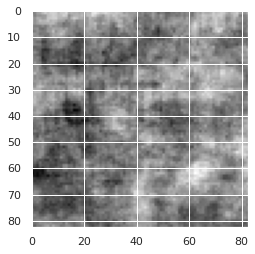

In [97]:
print(len(Xpca_list2))

plt.imshow(Xpca_list2[1][12,:,:], cmap='gray')

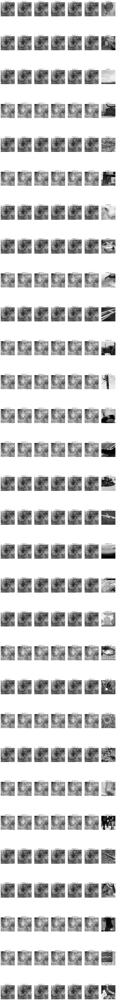

In [113]:
fig, axs = plt.subplots(30, 7, figsize=(20,180))
j = 0 #neuron
i = 0
max_transparency = 0.65

threshold_value = 1e-4 # only values above that will be shown. I guess it's the best to the the np.abs(gradRF) when setting the alphas to zero

i = 0
for k in range(0, 30):
   
    for p in range(0, 6):


        axs[k][p].title.set_text('neuron: ' + str(p))

        axs[k][p].imshow(Xpca_list2[p][i,:,:] ,cmap=  'gray')
        axs[k][p].axis('off')
        

        #axs[k][5].imshow(Xpca_list2[j][i,:,:] , alpha=alpha_values, cmap="PuRd", vmin=-max_intensity, vmax = max_intensity)


    axs[k][6].title.set_text('image: '+ str(i))
    axs[k][6].imshow(train_images[i].squeeze(0) ,cmap=  'gray')
    axs[k][6].axis('off')
    

    
    i+=1

        
plt.savefig('projection_of_images_with_PCs_of_RFs_1PCs')